In [46]:
import xarray as xr 
import matplotlib.pyplot as plt
import cmocean as cmo 
import pandas as pd 
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import numpy as np
import matplotlib.dates as mdates
# python -m ipykernel install --user --name schimpy --display-name Schimpy

# Start date 
start_date = '2024-08-06'

# M = 86400
M = 8640 
end_date = pd.to_datetime(start_date) + pd.Timedelta(seconds=(10*M))
dates = pd.date_range(start_date, end_date, freq='10s')
dates = dates


def format_date_ax(ax):
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
    date_format = mdates.DateFormatter('%m/%d %H:%M')
    ax.xaxis.set_major_formatter(date_format)


chla2cell_mc =  1e-6/0.36  # ug chl-a/ml --> pg chl-a/ml --> 0.36  pg chl-a/cell Microcystis
chla2cell_diatom = 1e-6/4 # ug chl-a/ml --> pg chl-a/ml --> 4 pg chl-a/cell Diatom
cell2chla_mc = 1/chla2cell_mc
cell2chla_diatom = 1/chla2cell_diatom

In [47]:
NITER = 10

read_in = [1, 2,  NITER-1, NITER]

guess = {} 
for i in read_in: #range(1, NITER):
    guess[i] = xr.open_dataset(f'forward_phyto/forward_{i}_AUGUST6-16.nc', decode_timedelta=False)

# Read in adjoint 
adjoint = {}
for i in read_in: #range(1, NITER):
    adjoint[i] = xr.open_dataset(f'backward_lambda/adjoint_{i}_AUGUST6-16.nc', decode_timedelta=False)

z = guess[1]["z"]

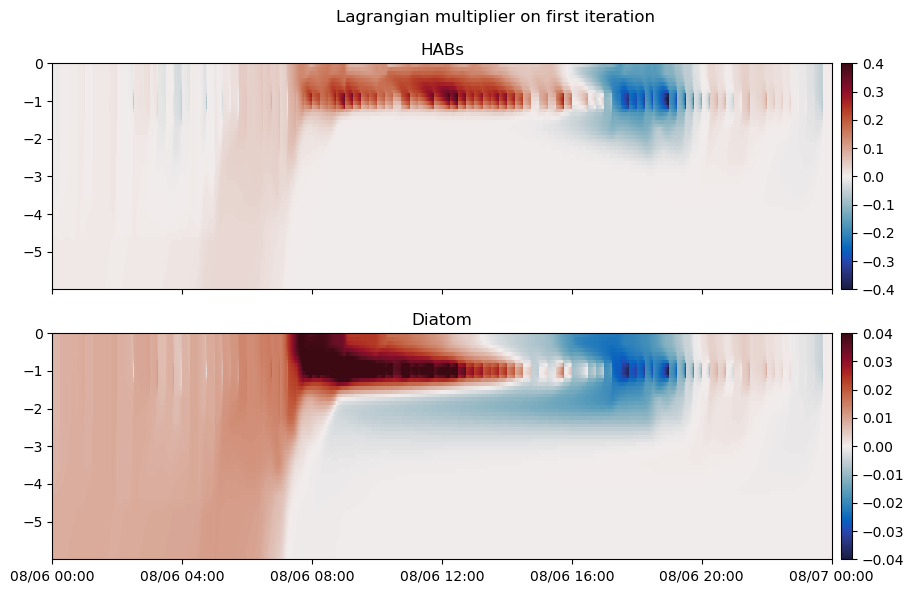

In [48]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True, sharey=True)

CLIM = 0.4
c = axs[0].pcolormesh(dates, -z, adjoint[1]['lambda1'].values.T, cmap=cmo.cm.balance , vmax=CLIM, vmin=-CLIM)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
plt.suptitle('Lagrangian multiplier on first iteration')
axs[0].set_title("HABs")

c = axs[1].pcolormesh(dates, -z, adjoint[1]['lambda2'].values.T, cmap=cmo.cm.balance , vmax=CLIM/10, vmin=-CLIM/10)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Diatom")

axs[0].set_xlim(dates[0], dates[-1])
format_date_ax(axs[0])

plt.tight_layout()

2.716296814650559e-07 0.0
6.877439298152197e-06 0.0


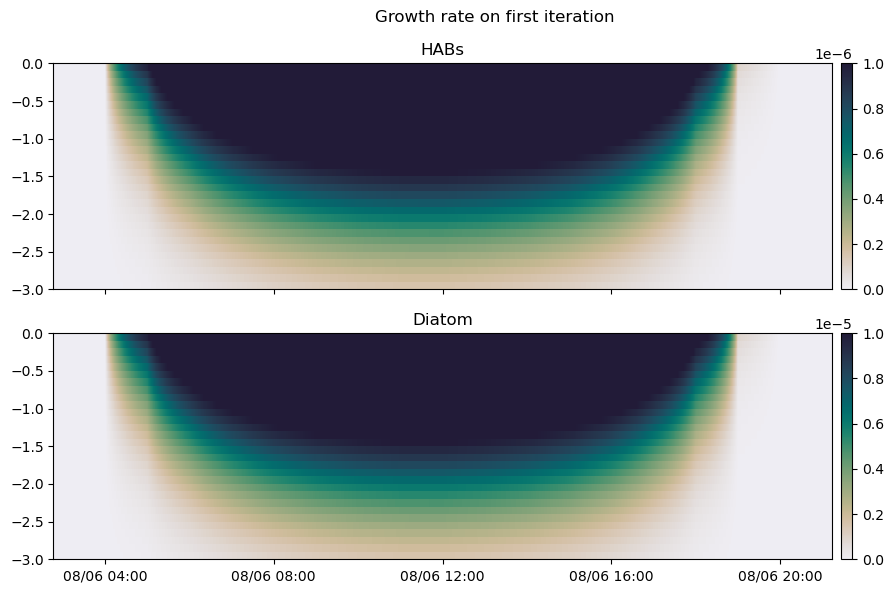

In [49]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True, sharey=True)

vmax = np.quantile(adjoint[NITER].gamma1.values.ravel(), 0.9)
vmin = np.quantile(adjoint[NITER].gamma1.values.ravel(), 0.1)
print(vmax, vmin)

vmax = np.quantile(adjoint[NITER].gamma2.values.ravel(), 0.9)
vmin = np.quantile(adjoint[NITER].gamma2.values.ravel(), 0.1)

print(vmax, vmin)

CLIM = 1e-5
c = axs[0].pcolormesh(dates, -z, guess[1].gamma1.values.T, cmap=cmo.cm.rain , vmax=CLIM/10, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
plt.suptitle('Growth rate on first iteration')
axs[0].set_title("HABs")

c = axs[1].pcolormesh(dates, -z, guess[1].gamma2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Diatom")

axs[0].set_xlim(dates[1000], dates[-1000])
format_date_ax(axs[0])
axs[0].set_ylim(-3, 0)

plt.tight_layout()

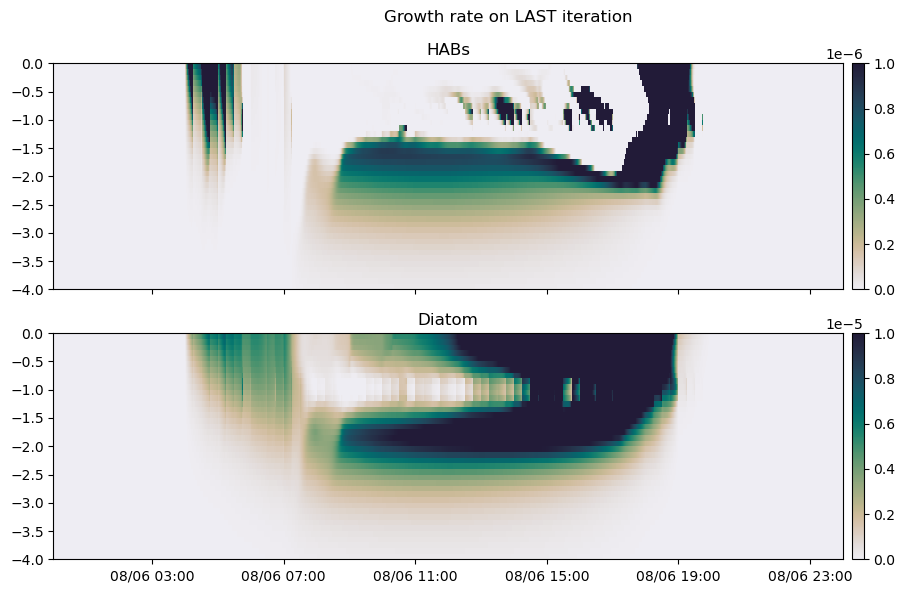

In [50]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True, sharey=True)
c = axs[0].pcolormesh(dates, -z, guess[NITER].gamma1.values.T, cmap=cmo.cm.rain , vmax=CLIM/10, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
plt.suptitle('Growth rate on LAST iteration')
axs[0].set_title("HABs")

c = axs[1].pcolormesh(dates, -z, guess[NITER].gamma2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Diatom")

# axs[0].set_xlim(dates[1000], dates[-1000])
format_date_ax(axs[0])
axs[0].set_ylim(-4, 0)

plt.tight_layout()

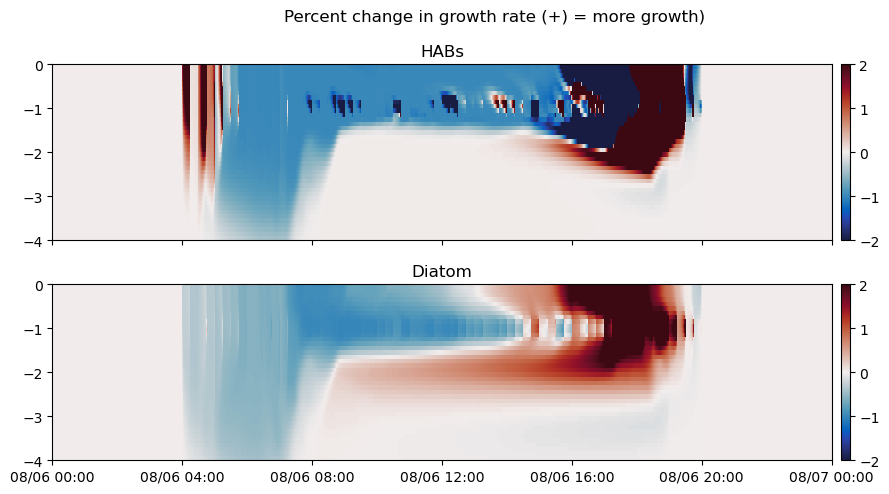

In [51]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), sharex=True, sharey=True)


CLIM = 2
difference = (guess[NITER].gamma1.values.T - guess[1].gamma1.values.T )/(guess[1].gamma1.values.T +1e-8)
c = axs[0].pcolormesh(dates, -z, difference, cmap=cmo.cm.balance , vmax=CLIM, vmin=-CLIM)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
plt.suptitle('Percent change in growth rate (+) = more growth)')
axs[0].set_title("HABs")


CLIM = 2
difference = (guess[NITER].gamma2.values.T - guess[1].gamma2.values.T )/(guess[1].gamma2.values.T+1e-8) 
c = axs[1].pcolormesh(dates, -z, difference, cmap=cmo.cm.balance , vmax=CLIM, vmin=-CLIM)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Diatom")

axs[0].set_xlim(dates[0], dates[-1])
format_date_ax(axs[0])
axs[0].set_ylim(-4, 0)

plt.tight_layout()

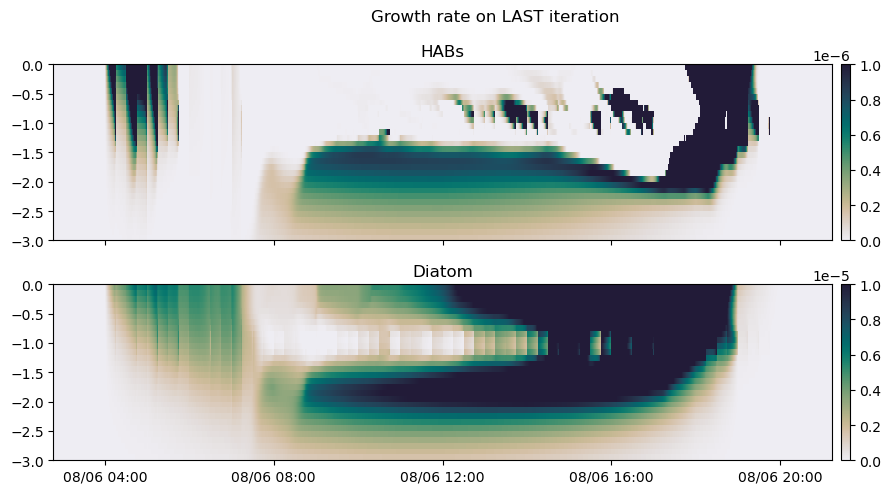

In [52]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), sharex=True, sharey=True)
CLIM = 1e-5
c = axs[0].pcolormesh(dates, -z, guess[NITER-1].gamma1.values.T, cmap=cmo.cm.rain , vmax=CLIM/10, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
plt.suptitle('Growth rate on LAST iteration')
axs[0].set_title("HABs")

c = axs[1].pcolormesh(dates, -z, guess[NITER-1].gamma2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Diatom")

axs[0].set_xlim(dates[1000], dates[-1000])
format_date_ax(axs[0])
axs[0].set_ylim(-3, 0)

plt.tight_layout()

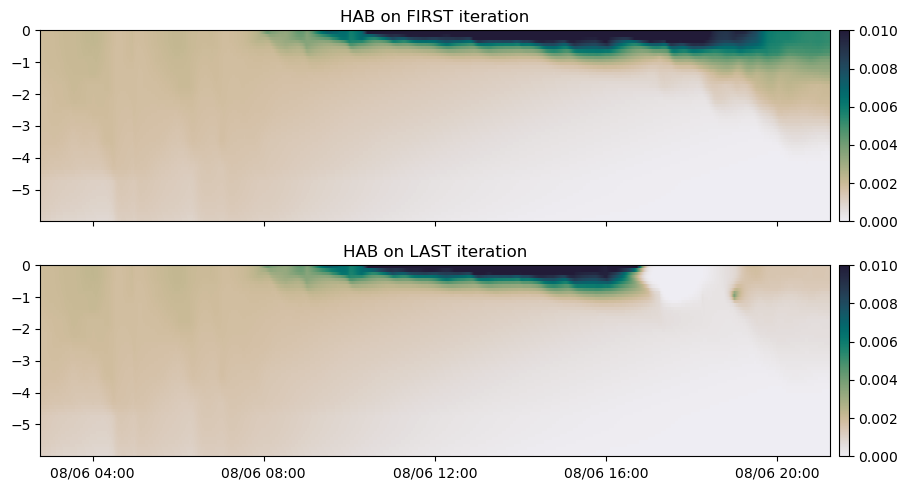

In [53]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), sharex=True, sharey=True)
CLIM = 0.01
c = axs[0].pcolormesh(dates, -z, guess[1].algae1.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[0].set_title("HAB on FIRST iteration")

c = axs[1].pcolormesh(dates, -z, guess[NITER-1].algae1.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("HAB on LAST iteration")

axs[0].set_xlim(dates[1000], dates[-1000])
format_date_ax(axs[0])

plt.tight_layout()

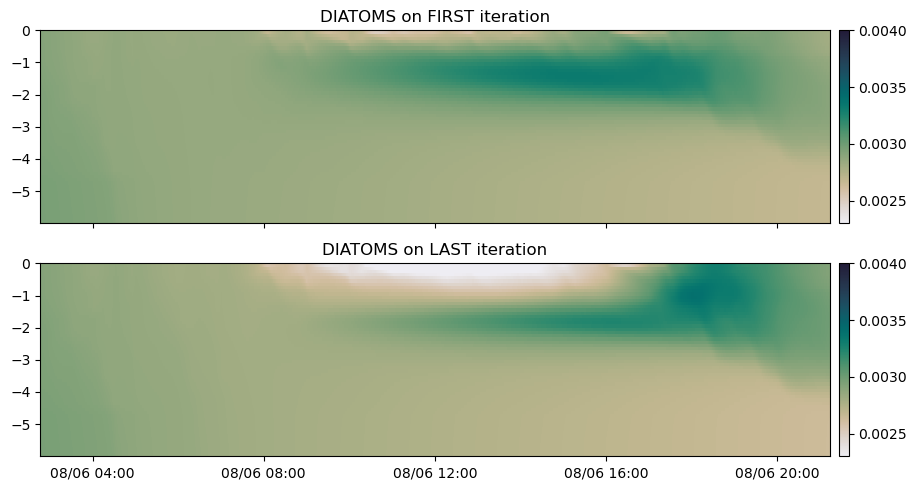

In [54]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), sharex=True, sharey=True)
CLIM = 0.004 #297235
c = axs[0].pcolormesh(dates, -z, guess[1].algae2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0.0023)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[0].set_title("DIATOMS on FIRST iteration")

c = axs[1].pcolormesh(dates, -z, guess[NITER-1].algae2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0.0023)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("DIATOMS on LAST iteration")

axs[0].set_xlim(dates[1000], dates[-1000])
format_date_ax(axs[0])

plt.tight_layout()


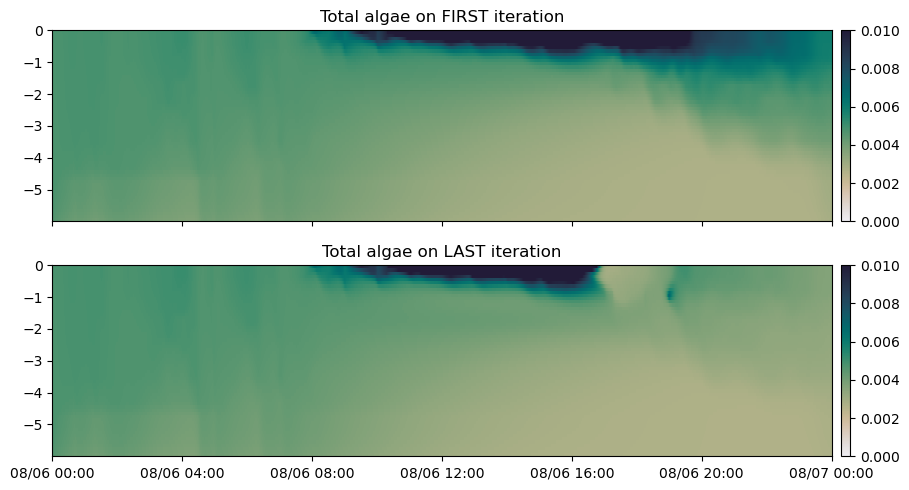

In [55]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), sharex=True, sharey=True)
CLIM = 0.01
c = axs[0].pcolormesh(dates, -z, guess[1].algae1.values.T + guess[1].algae2.values.T, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[0].set_title("Total algae on FIRST iteration")

total = guess[NITER-1].algae1.values.T + guess[NITER-1].algae2.values.T
c = axs[1].pcolormesh(dates, -z, total, cmap=cmo.cm.rain , vmax=CLIM, vmin=0)#, vmin=-1, vmax=1)
plt.colorbar(c, pad=0.01)
axs[1].set_title("Total algae on LAST iteration")

axs[0].set_xlim(dates[0], dates[-1])
format_date_ax(axs[0])

plt.tight_layout()

In [56]:
# fig, axs = plt.subplots(nrows=1, ncols=7, figsize=(10, 5), sharex=True, sharey=True)

# times = np.linspace(0, 8640, 7) 

# for i, ax in zip(times, axs):

#     i = int(i)
#     ax.plot(guess[1].algae1[i,:], -z, '--', label='HABs, 1st guess', color="#ED8B16", linewidth=1)
#     ax.plot(guess[NITER-1].algae1[i,:], -z, label='HABs, last guess', color="#ED8B16", linewidth=3, alpha=0.5) 
#     ax.plot(guess[1].algae2[i,:], -z, '--', label='Diatoms, 1st guess', color="#C2BB00", linewidth=1)
#     ax.plot(guess[NITER-1].algae2[i,:], -z, label='Diatoms, last guess', color="#C2BB00", linewidth=3, alpha=0.5)

#     ax.set_ylim(-6, 0)
#     # ax.set_xscale('log')
#     ax.grid(alpha=0.3)
# axs[0].legend()


In [57]:
# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 3), sharex=True, sharey=True)

# ax.plot(dates, guess[1].algae1.sum(dim='z'), '--', label='HABs, 1st guess', color="#ED8B16", linewidth=1)
# ax.plot(dates, guess[NITER-1].algae1.sum(dim='z'), label='HABs, last guess', color="#ED8B16", linewidth=3, alpha=0.5) 

# ax.plot(dates, guess[1].algae2.sum(dim='z'),'--', label='Diatoms, 1st guess', color="#C2BB00", linewidth=1)
# ax.plot(dates, guess[1].algae2.sum(dim='z'), label='Diatoms, last guess', color="#C2BB00", linewidth=3, alpha=0.5)

# ax.set_xlim(dates[0], dates[-1])
# # ax.set_ylim(0.135, 0.25)
# ax.legend(ncols=2)
# ax.grid(alpha=0.3)
# ax.set_ylabel("Algae biomass")
# format_date_ax(ax)

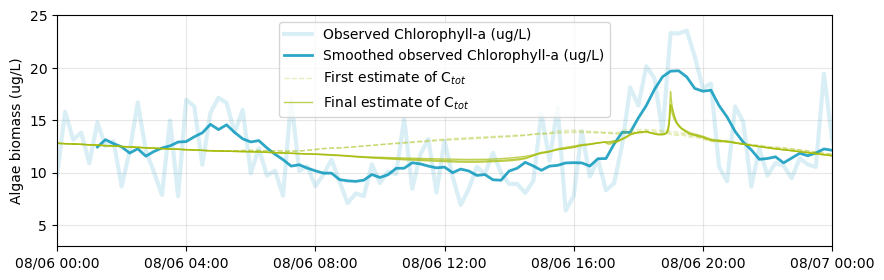

In [61]:

fig, ax = plt.subplots(1, 1, figsize=(10, 3), sharex=True)

# Chlorophyll-a data
chla = pd.read_csv("/global/homes/s/siennaw/scratch/siennaw/stockton_field_data/forcing_for_model/2024/august6-16/chla_for_adjoint.csv")
chla['time'] = pd.to_datetime(chla['time'])
hab = chla.pg_chla_perML  * 1e-3
ax.plot(chla.time, hab, color="#0998BC", alpha=0.15, linewidth=3, label='Observed Chlorophyll-a (ug/L)')

# Rolling average to smooth the data
hab = hab.rolling(window=10, center=True).mean()
ax.plot(chla.time, hab, color="#0998BC", alpha=0.85, linewidth=2, label='Smoothed observed Chlorophyll-a (ug/L)')


for i in range(49,52): 
    one_meter_data_1 = guess[1].isel(z=i)
    one_meter_data_N = guess[NITER].isel(z=i)

    # one_meter_data_1 = guess[1].isel(z=slice(50,52)).mean(dim='z')
    # one_meter_data_N = guess[NITER].isel(z=slice(50,52)).mean(dim='z')

    # First 
    total = one_meter_data_1['algae1'].values.T*cell2chla_mc + one_meter_data_1['algae2'].values.T*cell2chla_diatom
    ax.plot(dates[0:-2], total[0:-2]*1e-3, '--',  color='#A6BC09', linewidth=1, alpha=0.27)


    # End 
    total = one_meter_data_N['algae1'].values.T*cell2chla_mc + one_meter_data_N['algae2'].values.T*cell2chla_diatom
    ax.plot(dates[0:-2], total[0:-2]*1e-3, '-',  color='#A6BC09', linewidth=1, alpha=0.7)


ax.plot([], [], '--', label=r'First estimate of C$_{tot}$', color='#A6BC09', linewidth=1, alpha=0.27)
ax.plot([], [], '-', label=r'Final estimate of C$_{tot}$', color='#A6BC09', linewidth=1, alpha=0.7)

ax.set_xlim(dates[0], dates[-1])
ax.set_ylim(3, 25)
format_date_ax(ax)
ax.grid(alpha=0.3)
ax.set_ylabel("Algae biomass (ug/L)")
ax.legend()

# plt.suptitle("Comparing algae concentration from the model to mapping data @ 1m")
# plt.tight_layout()
# ax.plot(dates[0:-2], one_meter_data_N['algae1'].values.T[0:-2], '--', label='HAB', color='#ED8B16', linewidth=3, alpha=0.3)
# ax.plot(dates[0:-2], one_meter_data_N['algae2'].values.T[0:-2], '--', label='Diatom', color='#A6BC09', linewidth=3, alpha=0.3)

2648
2024-08-06 00:00:00
3509
2024-08-06 00:00:10
4574
2024-08-06 00:00:20
5817
2024-08-06 00:00:30
6359
2024-08-06 00:00:40
6800
2024-08-06 00:00:50


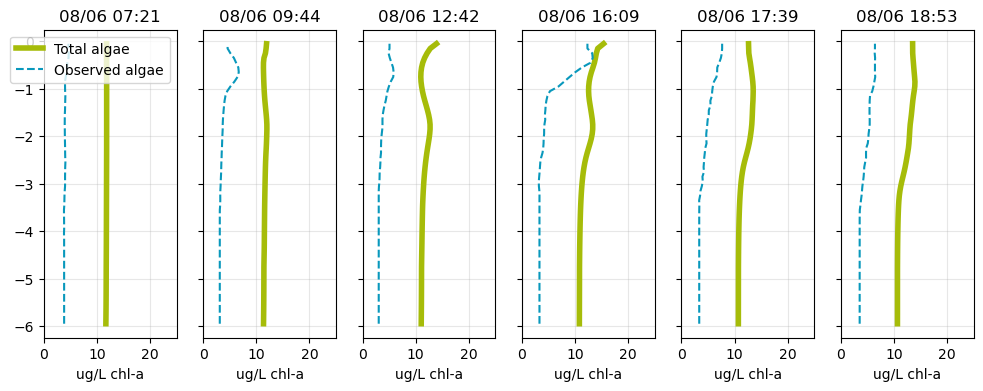

In [59]:

# Read in profiler data 
profiles = pd.read_csv("/global/homes/s/siennaw/scratch/siennaw/stockton_field_data/forcing_for_model/2024/august6-16/vertical_profiles_for_adjoint_pgML.csv")
profz = profiles['z'].values

prof_times = profiles.columns
prof_times = prof_times[:-1]

nprofiles = len(prof_times)


fig, axs = plt.subplots(nrows=1, ncols=6, figsize=(12, 4), sharex=True, sharey=True)
for i in range(0, 6):
    time = int(prof_times[i])  # Skip the first column which is 'z'
    print(time)
    total = guess[NITER]["algae1"].values[time,:]*cell2chla_mc + guess[NITER]["algae2"].values[time,:]*cell2chla_diatom

    axs[i].plot(total*1e-3, -z, color='#A6BC09', linewidth=4, label='Total algae')
    
    axs[i].plot(profiles[prof_times[i]]*1e-3, -profz, '--', color='#0998BC', markersize=3, label='Observed algae')

    axs[i].grid(alpha=0.3)
    axs[i].set_title(dates[time].strftime('%m/%d %H:%M'))
    print(dates[i])
    axs[i].set_xlabel("ug/L chl-a")
    axs[i].set_xlim(0, 25)
    axs[0].legend()


In [60]:
# chla  = mapping_data['model_time'].values

# mapping_data.index = pd.to_datetime(mapping_data['Timestamp (PST)'].values)
# test = mapping_data['fCHL (ug/L) (EXO) HR'].resample('15min').mean() #.mean()
# test.dropna(inplace=True)


# test2 = mapping_data['fCHL (ug/L) (WS) HR'].resample('30min').mean() #.mean()
# test2.dropna(inplace=True)

# test3 = mapping_data['Bluegreen Algae (ug/L) (FP) HR'].resample('30min').mean() #.mean()
# test3.dropna(inplace=True)

# percent = mapping_data['Bluegreen Algae (%) (FP) HR'].values
# hab = mapping_data['Diatoms (ug/L) (FP) HR'].values 



hab = mapping_data['fCHL (ug/L) (WS) HR'].values # * percent * 0.01



map_time = pd.to_datetime(mapping_data['time'].values)


one_meter_data_1 = guess[2].sel(z=1.0, method='nearest')
one_meter_data_N = guess[NITER-1].sel(z=1.0, method='nearest')

# Take surface layer 
one_meter_data_N = guess[NITER-1].sel(z=slice(1.5, 0.5)).mean(dim='z')


chla2cell = hab * 1e-3 # ug chl-a/L to ug/ml
chla2cell = hab *  1e6  # ug chl-a/ml to pg chl-a/ml
chla2cell = hab/ 0.72 # pg chl-a/ml / 0.72 pg chl-a/cell

fig, ax1 = plt.subplots(1, 1, figsize=(10, 6), sharex=True)

ax2 = ax1.twinx()

total = one_meter_data_N['algae1'].values.T + one_meter_data_N['algae1'].values.T
ax1.plot(dates[0:-2], one_meter_data_N['algae1'].values.T[0:-2], '--', label='HAB', color='#ED8B16', linewidth=3, alpha=0.3)
ax1.plot(dates[0:-2], one_meter_data_N['algae2'].values.T[0:-2], '--', label='Diatom', color='#A6BC09', linewidth=3, alpha=0.3)
ax1.plot(dates[0:-2], total[0:-2], '-', label='Total algae', color='#A6BC09', linewidth=3, alpha=0.7)

# axs[0].plot(dates, one_meter_data_N['algae1'].values.T, label='Latest guess algae (NITER=%d)' % NITER, color='#005148', linewidth=3)


x =  map_time
sorted_indices = np.argsort(x)
x = x[sorted_indices]

ax2.plot(test.index, test.values/1e6, '-o', label='Mapping chl-a', color="#88B570")
ax2.plot(test2.index, test2.values/1e6, '-o', label='Mapping diatoms', color="#C2BB00")
ax2.plot(test3.index, test3.values/1e6, '-o', label='Mapping HABs', color="#ED8B16")
ax1.legend()
ax1.grid(alpha=0.3)
ax1.set_xlim(dates[2000], dates[-1])
format_date_ax(ax1)
plt.suptitle("Comparing algae concentration from the model to mapping data @ 1m")
plt.tight_layout()

NameError: name 'mapping_data' is not defined


'DO (mg/L) (EXO) HR', 'DO (%sat) (EXO) HR', 'Turb (FNU) (EXO) HR',
'fCHL (ug/L) (EXO) HR', 
'fDOM (QSU) (EXO) HR',
'fCHL (ug/L) (WS) HR', 'fDOM (QSU) (WS) HR',
'Green Algae (ug/L) (FP) HR',
'Bluegreen Algae (ug/L) (FP) HR', 
'Diatoms (ug/L) (FP) HR',
'Cryptophyta (ug/L) (FP) HR', 
'Yellow substances (r.u.) (FP) HR',
'Total Conc (ug/L) (FP) HR', 
'Transmission (%) (FP) HR',
'Green Algae (%) (FP) HR',
'Bluegreen Algae (%) (FP) HR',
'Diatoms (%) (FP) HR',
'Cryptophyta (%) (FP) HR', 
'NO3 (uM) (SUNA) HR raw',
'NO3 (uM) (SUNA) HR', 
'NO3 (uM) (SUNA) rmk HR', 


NameError: name 'map_time' is not defined

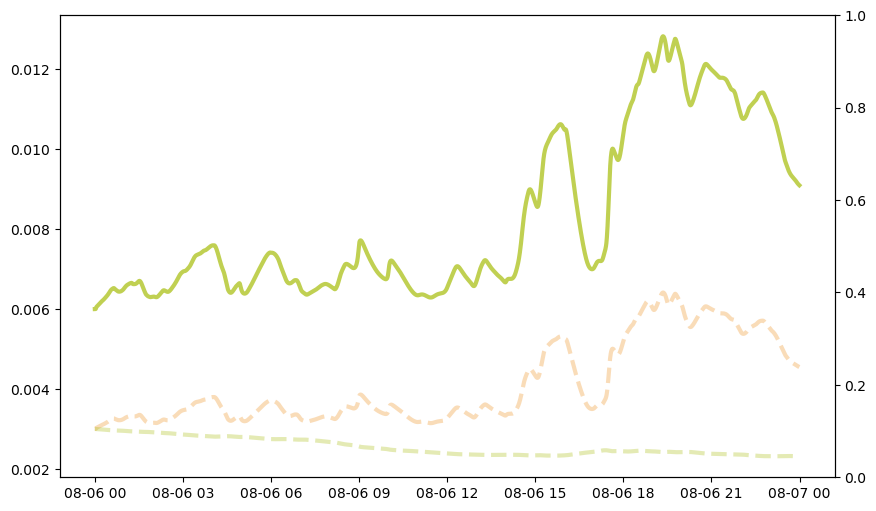

In [ ]:
# Chlorophyll-a data
chla = pd.read_csv("/global/homes/s/siennaw/scratch/siennaw/stockton_field_data/chla/preece_mls.csv")
chla['time'] = pd.to_datetime(chla['DATE TIME'])
chla.dropna(subset=['VALUE'], inplace=True)



one_meter_data_1 = guess[2].sel(z=slice(1.5, 0.5)).mean(dim='z')
one_meter_data_N = guess[NITER-1].sel(z=slice(1.5, 0.5)).mean(dim='z')



chla2cell = hab * 1e-3 # ug chl-a/L to ug/ml
chla2cell = hab *  1e6  # ug chl-a/ml to pg chl-a/ml
chla2cell = hab / 0.72 # pg chl-a/ml / 0.72 pg chl-a/cell

fig, ax1 = plt.subplots(1, 1, figsize=(10, 6), sharex=True)

ax2 = ax1.twinx()

total = one_meter_data_N['algae1'].values.T + one_meter_data_N['algae1'].values.T
ax1.plot(dates[0:-2], one_meter_data_N['algae1'].values.T[0:-2], '--', label='HAB', color='#ED8B16', linewidth=3, alpha=0.3)
ax1.plot(dates[0:-2], one_meter_data_N['algae2'].values.T[0:-2], '--', label='Diatom', color='#A6BC09', linewidth=3, alpha=0.3)
ax1.plot(dates[0:-2], total[0:-2], '-', label='Total algae', color='#A6BC09', linewidth=3, alpha=0.7)

# axs[0].plot(dates, one_meter_data_N['algae1'].values.T, label='Latest guess algae (NITER=%d)' % NITER, color='#005148', linewidth=3)


x =  map_time
sorted_indices = np.argsort(x)
x = x[sorted_indices]

# ax2.plot(test.index, test.values/1e6, '-o', label='Mapping chl-a', color="#88B570")
# ax2.plot(test2.index, test2.values/1e6, '-o', label='Mapping diatoms', color="#C2BB00")
# ax2.plot(test3.index, test3.values/1e6, '-o', label='Mapping HABs', color="#ED8B16")
ax1.legend()
ax1.grid(alpha=0.3)
ax1.set_xlim(dates[2000], dates[-1])
format_date_ax(ax1)
plt.suptitle("Comparing algae concentration from the model to mapping data @ 1m")
plt.tight_layout()

In [ ]:
frames = []

start = 0
end = 8640 
spacing = 6 

times = [dates[i] for i in range(start, end, spacing)]
# Create a frame for each phase shift
for i in range(start, end, spacing):
    h1 = go.Scatter(x=guess[NITER-1]["gamma1"][i,:], y=-z, name= "Best guess", mode='lines', line=dict(width=2, color="blue"))  
    h3 = go.Scatter(x=guess[2]["gamma1"][i,:], y=-z, name= "Guess gamma", mode='lines', line=dict(width=2, color="pink"))
    frames.append(go.Frame(data=[h1, h3], name=str(dates[i])))

# Initial figure
i = 0 
h1 = go.Scatter(x=guess[NITER-1]["gamma1"][i,:], y=-z, name= "Best guess", mode='lines', line=dict(width=2, color="blue"))  
h3 = go.Scatter(x=guess[2]["gamma1"][i,:], y=-z, name= "First gamma", mode='lines', line=dict(width=2, color="pink"))

fig = go.Figure( data=[h1, h3],
                layout=go.Layout(
                    title='growth (gamma) in the Water Column',
                    xaxis=dict(range=[-2e-5, 2e-5], title='growth [-]'), #range=[0, 1e-1],
                    yaxis=dict(range=[-6, 0], title='Water Depth (m)'),
                    updatemenus=[{
                    'type': 'buttons',
                    'showactive': False,
                    'buttons': [{
                        'label': 'Play',
                        'method': 'animate',
                        'args': [None, {
                            'frame': {'duration': 200, 'redraw': True},
                            'fromcurrent': True
                        }]
                    }]
                }],
                sliders=[{
                    'active': 0,
                    'steps': [{'label': t.strftime('%b/%d %H:%M'),'method': 'animate', 'args': [[str(t)], {'mode': 'immediate', 'frame': {'duration': 0}, 'transition': {'duration': 0}}]} for t in times]
                }]
            ),
    frames=frames
)
fig.show()


In [ ]:

plt.figure(figsize=(4, 5))

i = -1 
diff = guess["algae1"][i,:] - truth["algae1"][i,:]

plt.plot(diff, -z, linewidth=2)
plt.plot(adj["lambda"][i,:]/2 , -z, '--',linewidth=2)
# plt.plot(flip(diff), -z, linewidth=2)
plt.title(f"Cells/mL at time %s" % dates[-1])
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.grid(alpha=0.5)
plt.show()

print(adj["lambda"].shape)


KeyError: 'algae1'

<Figure size 400x500 with 0 Axes>

In [ ]:
# TURBULENT DIFFUSIVITY

frames = []

start = 0
end = 8998
spacing = 50 
times = [dates[i] for i in range(start, end, spacing)]
# Create a frame for each phase shift
for i in range(start, end, spacing):
    h1 = go.Scatter(x=hydro["Kz"][i,:], y=-z, name= "Turbulent Diffusivity", mode='lines', line=dict(width=2, color="blue"))  
    frames.append(go.Frame(data=[h1], name=str(dates[i])))

# Initial figure
h1 = go.Scatter(x=hydro["Kz"][i,:], y=-z, name= "Turbulent Diffusivity", mode='lines', line=dict(width=2, color="blue"))  
fig = go.Figure( data=[h1],
                layout=go.Layout(
                    title='TURBULENT DIFFUSIVITY',
                    xaxis=dict(range=[0, 0.01], title='Adjoint Variable [-]'),
                    yaxis=dict(range=[-6, 0], title='Water Depth (m)'),
                    updatemenus=[{
                    'type': 'buttons',
                    'showactive': False,
                    'buttons': [{
                        'label': 'Play',
                        'method': 'animate',
                        'args': [None, {
                            'frame': {'duration': 200, 'redraw': True},
                            'fromcurrent': True
                        }]
                    }]
                }],
                sliders=[{
                    'active': 0,
                    'steps': [{'label': t.strftime('%b/%d %H:%M'),'method': 'animate', 'args': [[str(t)], {'mode': 'immediate', 'frame': {'duration': 0}, 'transition': {'duration': 0}}]} for t in times]
                }]
            ),
    frames=frames
)
fig.show()


In [ ]:

ds = xr.open_dataset('adjoint.nc')

z = -ds['z'].values
time = ds['time'].values

plt.figure()
plt.plot(ds['lambda'].sum(dim='z'), linewidth=2)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.grid(alpha=0.5)
plt.show()




plt.figure()
for i in range(1998, 0, -100):
    print(dates[i])
    plt.plot(ds['lambda'].isel(time=i), z, color=cmo.cm.ice_r(i/10000), linewidth=2)
    # print("At time %d, sum(lambda) = %f" % (i, ds['lambda'].isel(time=i).sum()))
plt.title(f"Adjoint at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
# ax.set_xlim(-1e4,1e4)
ax.grid(alpha=0.5)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import cmocean as cmo 



ds = xr.open_dataset('../forward_phyto/phyto_TRUTH.nc')

z = ds['z'].values
time = ds['time'].values


plt.figure()
for i in range(9998, 0, -500):
    if i%3 == 0 :
        plt.plot(ds['algae1'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2, label=i)
    else : 
        plt.plot(ds['algae1'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2)
plt.title(f"Cells at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.legend()
# ax.set_xlim(0,4)
ax.grid(alpha=0.5)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import cmocean as cmo 

z = ds['z'].values
time = ds['time'].values


ds = xr.open_dataset('../run_hydro/HYDRO.nc')

plt.figure()
for i in range(9998, 0, -200):
    plt.plot(ds['Kz'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2)
    print("At time %d, sum(lambda) = %f" % (i, ds['Kz'].isel(time=i).sum()))
plt.title(f"Adjoint at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.set_xlim(0,2e-2)
ax.grid(alpha=0.5)
plt.show()